In [1]:
import os
from PIL import Image
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import backend as K

from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA

In [2]:
data_directory = r'/Users/apple/Downloads/dataset'
images_directory = os.path.join(data_directory, r'images')
# masks_directory = os.path.join(data_directory, r'masks')
masks_directory = r'/Users/apple/Documents/GitHub/U-Net-code/masks'

In [3]:
images_walk_data = list(os.walk(images_directory))
masks_walk_data = list(os.walk(masks_directory))

In [4]:
imagesfilenames = images_walk_data[0][2]
masksfilenames = [i[:-4]+'.png' for i in imagesfilenames]

In [ ]:
# imagesfilenames = [i for i in imagesfilenames if 'open_circuit' in i]
# masksfilenames = [i[:-4]+'.png' for i in imagesfilenames]

In [5]:
images_filepaths = [os.path.join(images_walk_data[0][0], i) for i in imagesfilenames]
masks_filepaths = [os.path.join(masks_walk_data[0][0], i) for i in masksfilenames]

In [6]:
image = np.array(Image.open(masks_filepaths[0]))
number_of_images = len(imagesfilenames)
number_of_pixels = image.size

In [ ]:
# # input_shape = (1586, 3034)
# #input_shape = (352, 640)
# input_shape = (480, 352)
# number_of_output_neurons = number_of_pixels
# number_of_input_neurons = number_of_pixels*1



In [ ]:
# x = np.zeros((number_of_images, *input_shape, 1))
# y = np.zeros((number_of_images, *input_shape))

In [ ]:
# for i in range(number_of_images):
#     image = np.array(Image.open(images_filepaths[i]).convert('L').resize(input_shape, Image.Resampling.LANCZOS)).reshape((*input_shape,1))
#     x[i,:] = image/255
#     mask = np.array(Image.open(masks_filepaths[i]).convert('L').resize(input_shape, Image.Resampling.LANCZOS)).reshape((input_shape))
#     y[i,:] = mask/255

In [7]:
input_shape = (480, 352, 3)
input_shape_numpy = (input_shape[1], input_shape[0], 3)
number_of_pixels = np.prod(input_shape)
number_of_output_neurons = number_of_pixels

n_augmentation = 2

In [8]:
X = np.zeros((n_augmentation*number_of_images, *input_shape_numpy))
y = np.zeros((n_augmentation*number_of_images, *input_shape_numpy[:2]))

In [9]:

for i in range(number_of_images):
    ind = n_augmentation*i
    image = Image.open(images_filepaths[i]).resize(input_shape[:2], Image.Resampling.LANCZOS)
    mask = Image.open(masks_filepaths[i]).resize(input_shape[:2], Image.Resampling.LANCZOS)
    X[ind,:] = np.array(image)/255
    X[ind+1,:] = np.array(image.transpose(Image.FLIP_LEFT_RIGHT))/255
    y[ind,:] = np.array(mask)/255
    y[ind+1,:] = np.array(mask.transpose(Image.FLIP_LEFT_RIGHT))/255


In [10]:
y[y < 0.5] = 0
y[y >= 0.5] = 1

In [17]:
i = 100

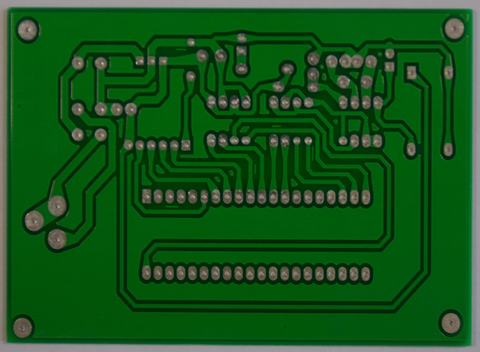

In [18]:
Image.fromarray(np.uint8(X[i]*255))

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 723ms/step


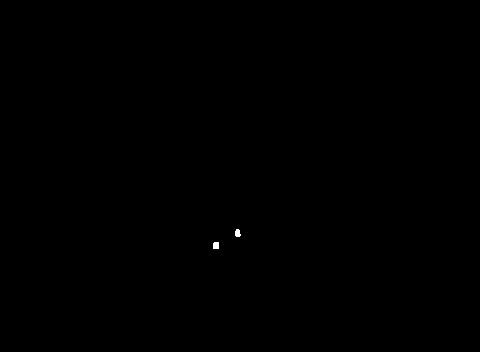

In [61]:
Image.fromarray(np.uint8(255*model.predict(X_test[i:i+1])[0,:,:,0]))

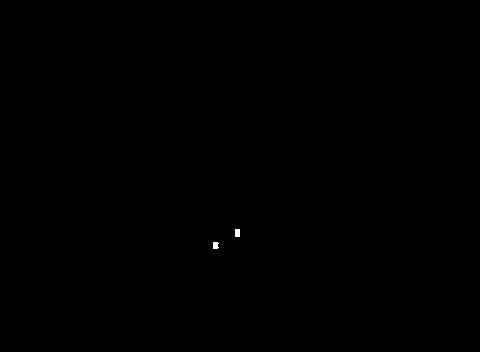

In [62]:
Image.fromarray(np.uint8(255*y_test[i:i+1])[0,:,:])

In [11]:
def iou_value(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    y_true_f = tf.cast(y_true_f, tf.float32)
    y_pred_f = tf.cast(y_pred_f, tf.float32)

    intersection = K.sum(y_true_f * y_pred_f)
    union = K.sum(y_true_f) + K.sum(y_pred_f) - intersection

    iou = intersection / (union + K.epsilon())
    return iou

def accuracy_value(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    y_pred_f = tf.round(y_pred_f)
    correct_preds = tf.cast(tf.equal(y_true_f, y_pred_f), tf.float32)
    accuracy = tf.reduce_mean(correct_preds)
    return accuracy

# def double_conv_block(x, n_filters):
#     x = tf.keras.layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
#     x = tf.keras.layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
#     return x

# def double_conv_block(x, n_filters):
#     x = tf.keras.layers.Conv2D(n_filters, 3, padding="same", kernel_initializer="he_normal")(x)
#     x = tf.keras.layers.BatchNormalization()(x)  # Batch normalization added
#     x = tf.keras.layers.Activation("relu")(x)

#     x = tf.keras.layers.Conv2D(n_filters, 3, padding="same", kernel_initializer="he_normal")(x)
#     x = tf.keras.layers.BatchNormalization()(x)  # Batch normalization added
#     x = tf.keras.layers.Activation("relu")(x)
#     return x


def double_conv_block(x, n_filters):
    x = tf.keras.layers.Conv2D(n_filters, 3, padding="same", kernel_initializer="he_normal")(x)
    x = tf.keras.layers.LayerNormalization()(x)
    x = tf.keras.layers.Activation("relu")(x)

    x = tf.keras.layers.Conv2D(n_filters, 3, padding="same", kernel_initializer="he_normal")(x)
    x = tf.keras.layers.LayerNormalization()(x)
    x = tf.keras.layers.Activation("relu")(x)
    return x

def downsample_block(x, n_filters, d):
    f = double_conv_block(x, n_filters)
    p = tf.keras.layers.MaxPool2D(2)(f)
    p = tf.keras.layers.Dropout(d)(p)
    return f, p

def upsample_block(x, conv_features, n_filters, d):
    x = tf.keras.layers.Conv2DTranspose(n_filters, 3, 2, padding="same")(x)

    # # Apply attention gate
    # attn_g = attention_gate(conv_features, x, n_filters, n_filters * 2)

    # x = tf.keras.layers.concatenate([attn_g, x])  # Concatenate attention-weighted features

    x = tf.keras.layers.concatenate([conv_features, x])

    x = tf.keras.layers.Dropout(d)(x)
    x = double_conv_block(x, n_filters)
    return x

def build_unet_model(input_image_shape, n, d):
    inputs = tf.keras.layers.Input(shape=input_image_shape)

    f1, p1 = downsample_block(inputs, 16*n, d)
    f2, p2 = downsample_block(p1, 32*n, d)
    f3, p3 = downsample_block(p2, 64*n, d)
    f4, p4 = downsample_block(p3, 128*n, d)

    bottleneck = double_conv_block(p4, 256*n)

    u6 = upsample_block(bottleneck, f4, 128*n, d)
    u7 = upsample_block(u6, f3, 64*n, d)
    u8 = upsample_block(u7, f2, 32*n, d)
    u9 = upsample_block(u8, f1, 16*n, d)

    outputs = tf.keras.layers.Conv2D(1, 1, padding="same", activation = "sigmoid")(u9)

    unet_model = tf.keras.Model(inputs, outputs, name="U-Net_with_Attention_Gate")
    return unet_model

def attention_gate(x, g, in_channels, gate_channels, inter_channels=None, sub_sample_factor=(2, 2)):
    if inter_channels is None:
        inter_channels = in_channels // 2

    W_g = tf.keras.Sequential([
        tf.keras.layers.Conv2D(inter_channels, kernel_size=1, strides=1, padding='same', use_bias=False),
        tf.keras.layers.BatchNormalization()
    ])(g)

    W_x = tf.keras.Sequential([
        tf.keras.layers.Conv2D(inter_channels, kernel_size=1, strides=sub_sample_factor, padding='same', use_bias=False),
        tf.keras.layers.BatchNormalization()
    ])(x)

    # Upsample W_x to match the spatial dimensions of W_g
    W_x = tf.keras.layers.UpSampling2D(size=sub_sample_factor, interpolation='bilinear')(W_x)

    psi = tf.keras.layers.ReLU()(tf.keras.layers.Add()([W_g, W_x]))
    psi = tf.keras.layers.Conv2D(1, kernel_size=1, strides=1, padding='same', use_bias=False)(psi)
    psi = tf.keras.layers.BatchNormalization()(psi)
    psi = tf.keras.layers.Activation('sigmoid')(psi)

    return tf.keras.layers.Multiply()([x, psi])



In [12]:
def dice_loss(y_true, y_pred, smooth=1e-6):
    intersection = tf.reduce_sum(y_true * y_pred)
    return 1 - (2.*intersection + smooth)/(tf.reduce_sum(y_true)+tf.reduce_sum(y_pred)+smooth)

In [13]:
model = build_unet_model(input_shape_numpy, 2,0.3)

In [14]:
# optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)

In [ ]:
# model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=[accuracy_value, 'Precision', 'Recall', iou_value])

In [14]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss=dice_loss,
    metrics=[accuracy_value, 'Precision', 'Recall', iou_value]
)

In [ ]:
# model = tf.keras.models.load_model("unet_model.keras", custom_objects={"accuracy_value": accuracy_value})

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [16]:
model = tf.keras.models.load_model('/Users/apple/Documents/GitHub/SASTRA/Final Year Projects/2024-2025-2/Harini/unet.keras', custom_objects={'dice_loss': dice_loss, 'accuracy_value': accuracy_value, 'iou_value': iou_value})

In [17]:
model.evaluate(X_test, y_test, batch_size = 16)

I0000 00:00:1748243063.757379  178874 service.cc:152] XLA service 0x15cca0620 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1748243063.757402  178874 service.cc:160]   StreamExecutor device (0): Host, Default Version
2025-05-26 12:34:24.082462: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1748243065.195956  178874 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


18/18 ━━━━━━━━━━━━━━━━━━━━ 115s 6s/step - Precision: 0.0602 - Recall: 0.2926 - accuracy_value: 0.9955 - iou_value: 0.0576 - loss: 0.8921


[0.889886200428009,
 0.995757520198822,
 0.05897994339466095,
 0.31445932388305664,
 0.05998256430029869]

In [18]:
history = model.fit(X_train,y_train, epochs = 1000, batch_size=16)

Epoch 1/1000
 2/70 ━━━━━━━━━━━━━━━━━━━━ 1:15:15 66s/step - Precision: 0.0515 - Recall: 1.0000 - accuracy_value: 0.9969 - iou_value: 0.0516 - loss: 0.9019 

: 

In [ ]:
import numpy as np
unique_values, counts = np.unique(y, return_counts=True)
print("Mask values and counts:", dict(zip(unique_values, counts)))

In [ ]:
model.evaluate(X_train,y_train, batch_size=16)

In [ ]:
model.evaluate(X_test,y_test, batch_size=16)

9/9 ━━━━━━━━━━━━━━━━━━━━ 52s 3s/step - Precision: 0.8800 - Recall: 0.8644 - accuracy_value: 0.9991 - iou_value: 0.7732 - loss: 0.1279


[0.12696006894111633,
 0.999085009098053,
 0.8819053173065186,
 0.8644507527351379,
 0.7743470668792725]

In [ ]:
model.save(r'/content/drive/MyDrive/SASTRA/Projects/2024-2025/Final Year/Harini/unet.keras')

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'])

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history2.history['loss'])

In [ ]:

plt.plot(history3.history['loss'])

In [ ]:
import pickle
with open('/content/drive/MyDrive/SASTRA/Projects/2024-2025/Final Year/Harini/history.pkl', 'wb') as file:
    pickle.dump(history.history, file)

NameError: name 'history' is not defined

In [ ]:

# for i in range(number_of_images):
#     ind = n_augmentation*i
#     image = Image.open(images_filepaths[i]).convert('L').resize(input_shape, Image.Resampling.LANCZOS)
#     mask = Image.open(masks_filepaths[i]).convert('L').resize(input_shape, Image.Resampling.LANCZOS)
#     X[ind,:] = np.array(image).flatten()
#     X[ind+1,:] = np.array(image.transpose(Image.FLIP_LEFT_RIGHT)).flatten()
#     y[ind,:] = np.array(mask).flatten()
#     y[ind+1,:] = np.array(mask.transpose(Image.FLIP_LEFT_RIGHT)).flatten()


In [ ]:
# for i in range(number_of_images):
#     image = np.array(Image.open(images_filepaths[i]).convert('L')).resize(input_shape, Image.Resampling.LANCZOS)
#     image_array = image.flatten()
#     X[i,:] = image_array
#     mask = np.array(Image.open(masks_filepaths[i]).convert('L')).flatten().resize(input_shape, Image.Resampling.LANCZOS)
#     mask_array = mask.flatten()
#     y[i,:] = mask_array

In [ ]:
# X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2)

In [ ]:
# k = set(y.flatten().tolist())

In [ ]:


# number_of_input_neurons = 30
# number_of_output_neurons = number_of_pixels



In [ ]:
# def iou_value(y_true, y_pred):
#     y_true_f = K.flatten(y_true)
#     y_pred_f = K.flatten(y_pred)
#     y_true_f = tf.cast(y_true_f, tf.float32)
#     y_pred_f = tf.cast(y_pred_f, tf.float32)

#     intersection = K.sum(y_true_f * y_pred_f)
#     union = K.sum(y_true_f) + K.sum(y_pred_f) - intersection

#     iou = intersection / (union + K.epsilon())
#     return iou

# def accuracy_value(y_true, y_pred):
#     y_true_f = K.flatten(y_true)
#     y_pred_f = K.flatten(y_pred)
#     y_pred_f = tf.round(y_pred_f)
#     correct_preds = tf.cast(tf.equal(y_true_f, y_pred_f), tf.float32)
#     accuracy = tf.reduce_mean(correct_preds)
#     return accuracy


In [ ]:
input_shape

In [23]:
def show_image(image_filepath, threshold = 0.5):
    img = Image.open(image_filepath)
    return img

def show_segmentation(image_filepath, threshold = 0.5):
    img_array = np.array(Image.open(image_filepath).resize(input_shape_numpy[:-1], Image.Resampling.LANCZOS)).reshape((1,*input_shape_numpy))
    #flattened_img_array = img_array.flatten()
    scaled_img = img_array/255
    prediction = model.predict(scaled_img)
    prediction[prediction>=threshold] = 1
    prediction[prediction<threshold] = 0
    prediction = prediction.reshape(input_shape_numpy[:-1])
    img = Image.fromarray(np.uint8(prediction)*255)
    return img

In [34]:
i = 500

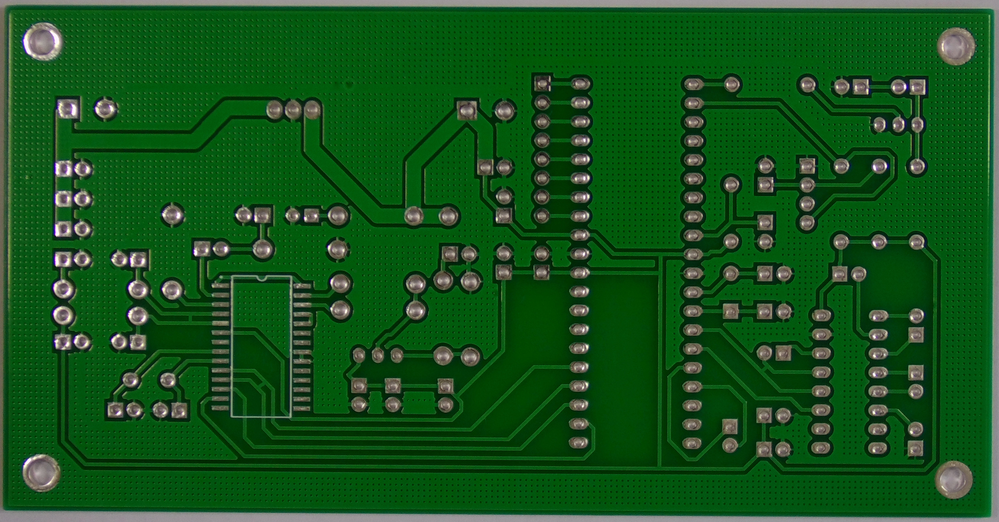

In [35]:
show_image(images_filepaths[i])

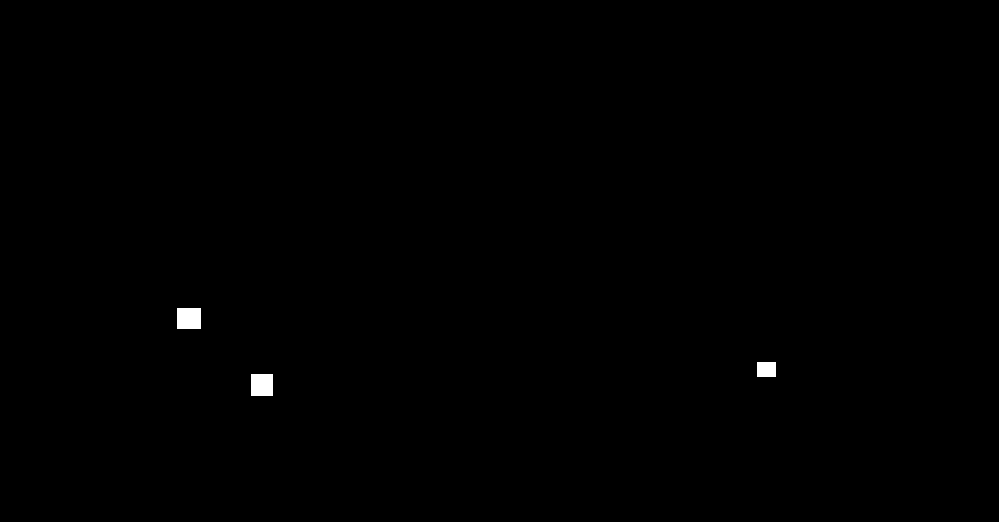

In [36]:
show_image(masks_filepaths[i])

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


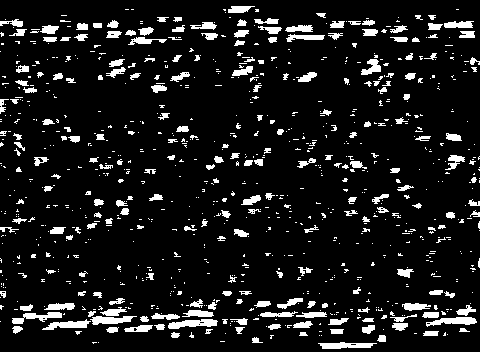

In [37]:
show_segmentation(images_filepaths[i])

In [ ]:
image(masks_filepaths[10])

In [ ]:
set(X_train.flatten().tolist())

In [ ]:
image

In [ ]:
Image.fromarray(np.uint8(X_test[-5]*255))

In [ ]:
Image.fromarray(np.uint8(y_test[-5]*255))